# Zadanie 1 - Analiza obrazów
- Wczytaj obraz przedstawiający tekst, dokonaj odwrócenia kolorów (czarne tło), a  
następnie jego transformacji do domeny częstotliwościowej za pomocą DFT. Przed-  
staw wartości fazy i modułu współczynników Fouriera (osobno).  

- Wybierz przykładowego reprezentanta grupy - wytnij z dużego zdjęcia wzorzec  
obiektu np. literę e lub charakterystyczny fragment ryby z ławicy (imcrop)  

- Wykorzystując transformację Fouriera oblicz korelację między wybranym wzorcem,  
a całym obrazem.  

- Przedstaw otrzymany obraz wyjściowy oraz punkty, w których wykryto wystąpie-  
nie wzorca (nałóż je na obraz oryginalny).  

- Znajdź liczbę wystąpień wzorca. Testy przeprowadź na dwóch zbiorach danych.


## biblioteki

In [57]:
import numpy as np
from PIL import Image, ImageOps

## funkcje

In [58]:
def to_grayscale(image, invert=False):
    image = image.convert('L')
    if invert:
        return ImageOps.invert(image)
    return image

def from_grayscale(image):
    array = np.asarray(image)
    return np.array([[(val, val, val) for val in row] for row in array])

def scale_image(image, factor):
    return image.resize(np.array(image.size) * factor)

In [59]:
def get_dtf_phase_and_modulus(image):
    array = np.asarray(image)
    result = np.fft.fft2(array)

    modulus = np.log(np.absolute(result))
    modulus /= np.max(modulus)
    modulus *= 255

    modulus_image = Image.fromarray(modulus)
    modulus_image = modulus_image.convert("RGB")

    phase = (np.angle(result) + np.pi) * 255 / (2 * np.pi)
    phase_image = Image.fromarray(phase)
    phase_image = phase_image.convert("RGB")

    return modulus_image, phase_image

In [60]:
def calculate_correlation(image, searched):
    image_w, image_h = image.size

    result = np.fft.ifft2(
        np.fft.fft2(image) * np.fft.fft2(np.rot90(np.rot90(searched)), s=(image_h, image_w))
    ).real

    result /= np.abs(np.max(result))
    return result

def show_correlation(correlation):
    log_correlation = np.exp(correlation) - 1
    log_correlation /= np.max(log_correlation)
    log_correlation *= 255

    log_correlation_image = Image.fromarray(log_correlation)
    log_correlation_image = log_correlation_image.convert("RGB")

    display(log_correlation_image)

In [61]:
def show_found_elements(image_arr, correlation, probability, selection_size, color=(255, 0, 0)):
    found_locations = []
    for y in range(correlation.shape[0]):
        for x in range(correlation.shape[1]):
            if correlation[y, x] > probability:
                found_locations.append((x, y))

    result = image_arr.copy()
    for x, y in found_locations:
        for dy in range(0, selection_size[0], np.sign(selection_size[0])):
            for dx in range(0, selection_size[1], np.sign(selection_size[1])):
                result[y + dy, x + dx] = color

    result_image = Image.fromarray(result)
    display(result_image)

## 1 - galia image

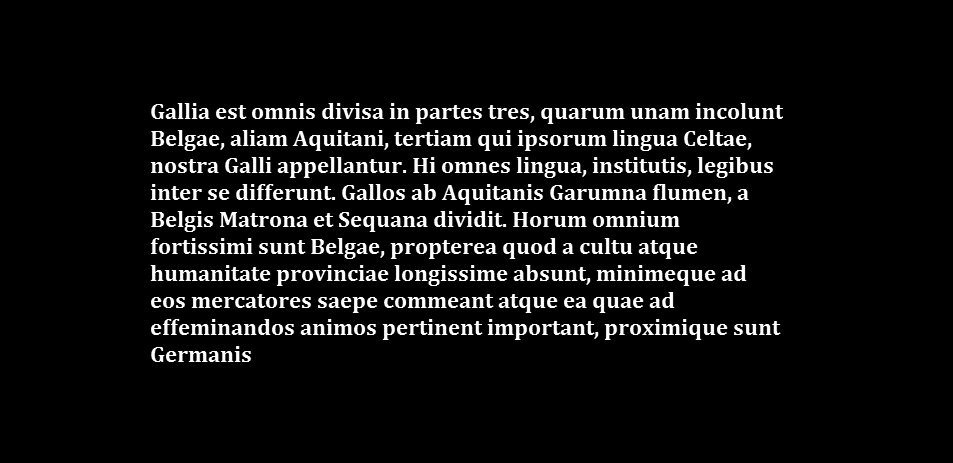

In [62]:
galia = to_grayscale(Image.open('images/galia.png'), invert=True)
galia_e = to_grayscale(Image.open('images/galia_e.png'), invert=True)

display(galia)

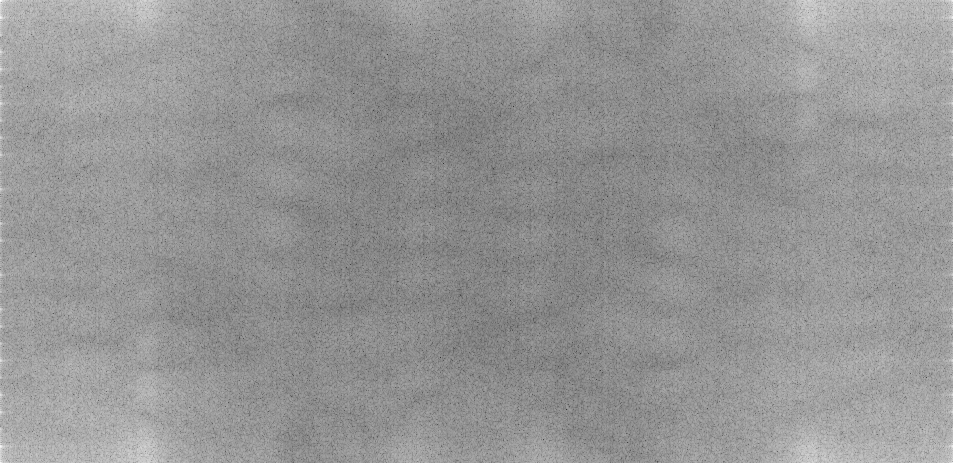

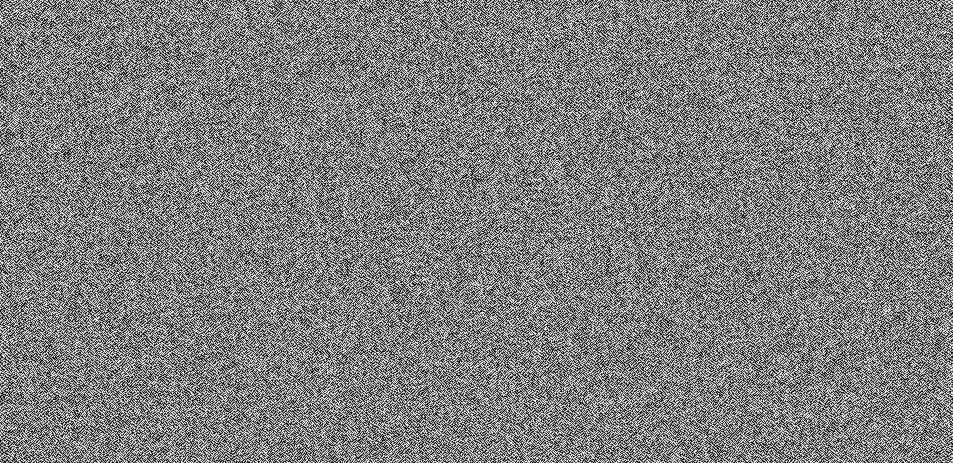

In [63]:
modulus_galia, phase_galia = get_dtf_phase_and_modulus(galia)

display(modulus_galia)
display(phase_galia)

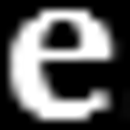

In [64]:
display(scale_image(galia_e, 10))

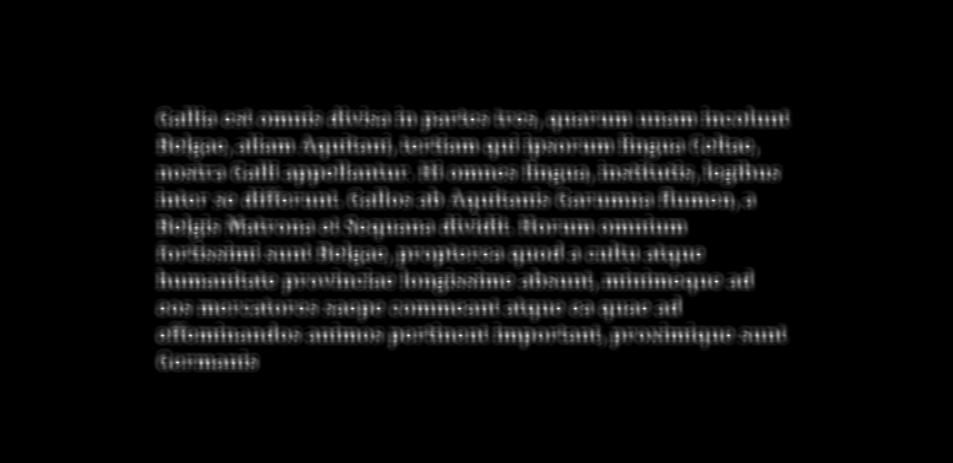

In [65]:
correlation = calculate_correlation(galia, galia_e)
show_correlation(correlation)

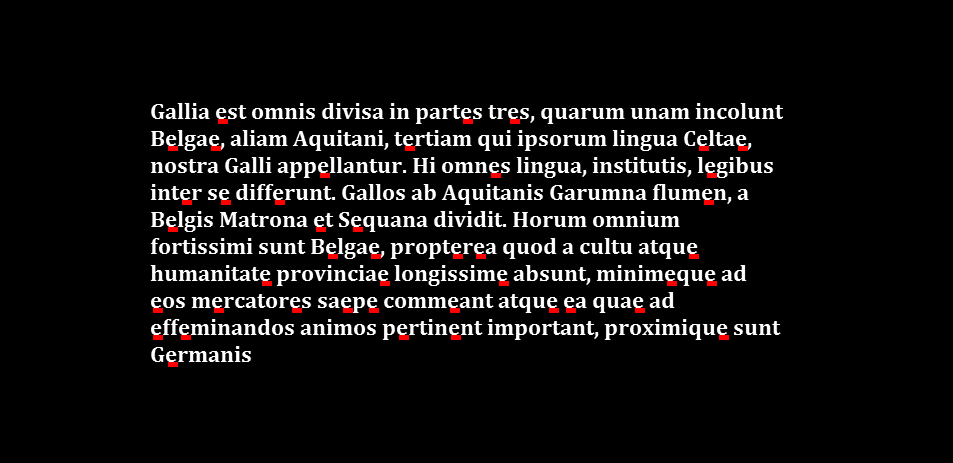

In [66]:
show_found_elements(
    from_grayscale(galia), 
    correlation, 
    0.9, 
    (5, -10)
)

## 2 - fish image

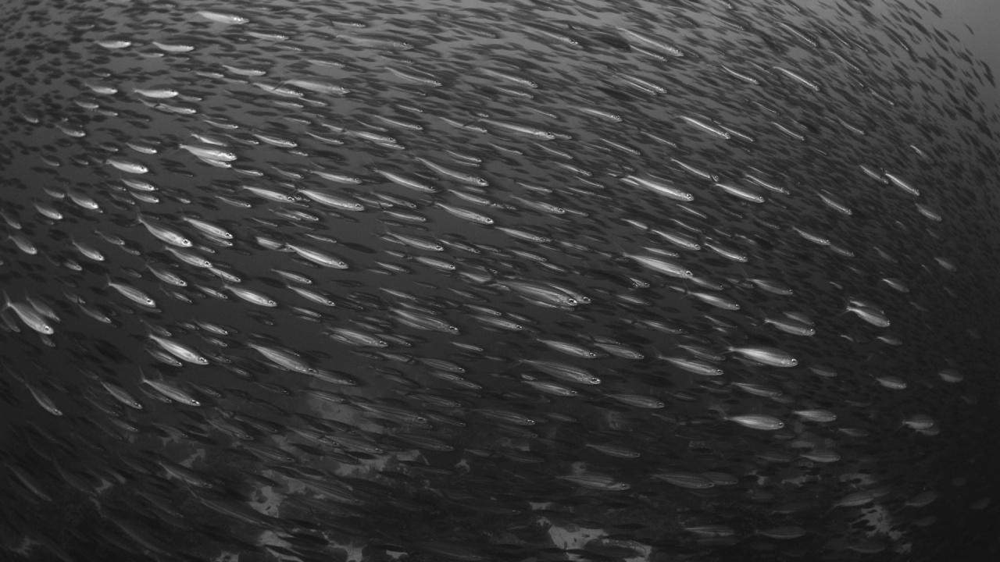

In [67]:
fishes_color = Image.open('images/school.jpg').convert('RGB')
fishes = to_grayscale(fishes_color, invert=False)

fish = to_grayscale(Image.open('images/fish1.png'), invert=False)

display(fishes)
display(fish)

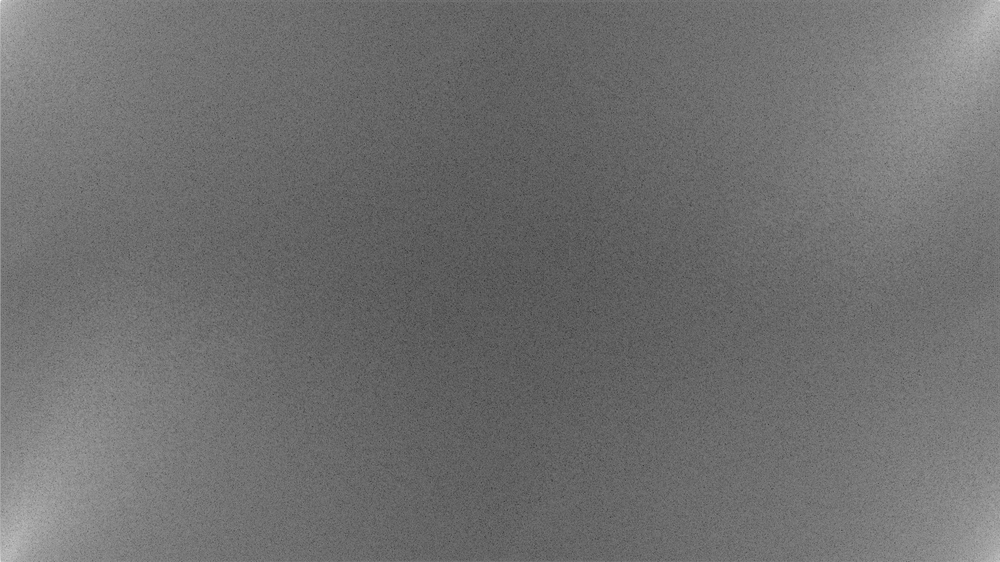

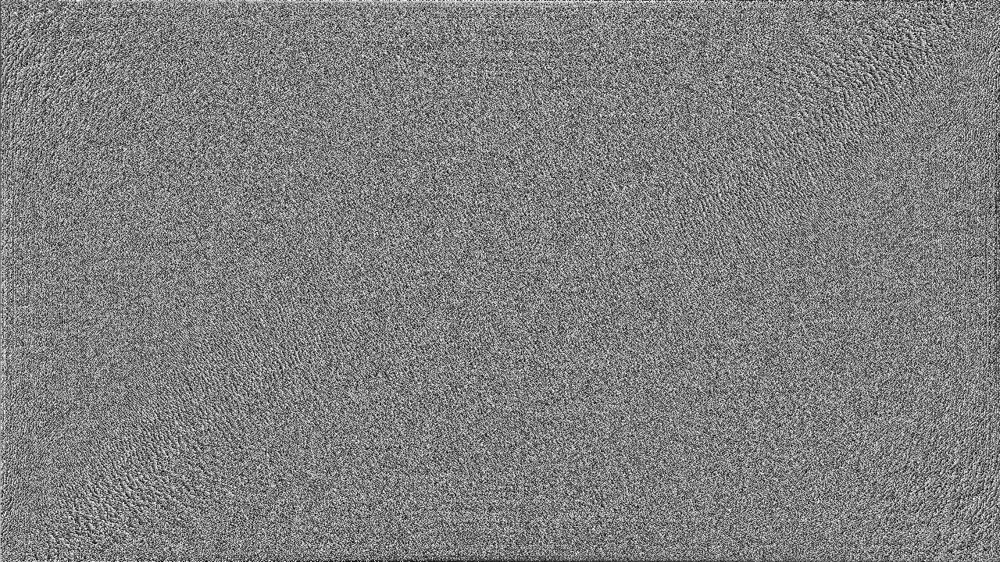

In [68]:
modulus_fishes, phase_fishes = get_dtf_phase_and_modulus(fishes)
display(modulus_fishes)
display(phase_fishes)

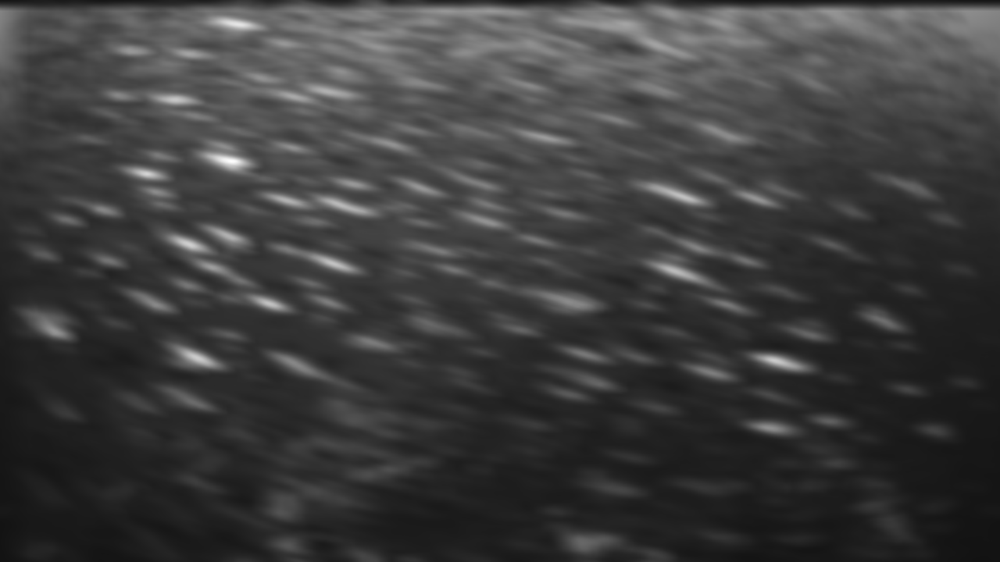

In [69]:
correlation = calculate_correlation(fishes, fish)
show_correlation(correlation)

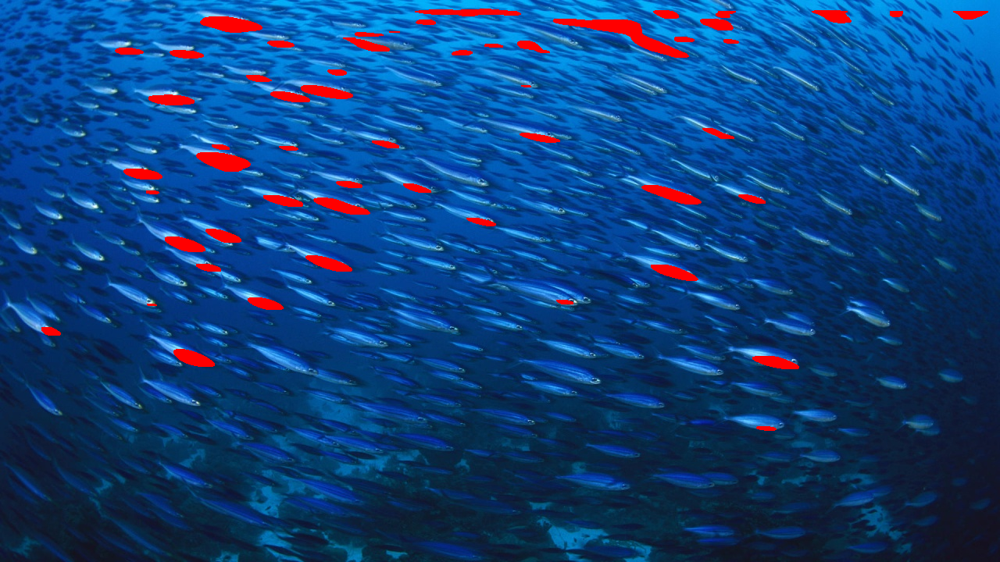

In [70]:
show_found_elements(
    np.asarray(fishes_color),
    correlation,
    0.65,
    (2, -10)
)